## Experients with a real-world dataset with an artifical signal

In [ ]:
import os
import tqdm

import pandas as pd
import numpy as np
import networkx as nx
import itertools

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import MinMaxScaler, normalize
from sklearn.metrics import adjusted_rand_score
from sklearn.cluster import KMeans

from graphkke.algorithm import m_graphkke
import graphkke.algorithm.kernels as kernels
import graphkke.graph.graph as gl

sns.set(rc={'figure.figsize': (20, 15)})

In [2]:
# Generate an artificial signal
def signal(size):
    period = 20
    t = np.linspace(-20, 20, size)
    N = len(t)
    noise_level = 0.05

    d = 100 * np.sin(2 * np.pi * t / period)
    r = np.random.randn(1, N)

    dn_1 = d + noise_level * r * d
    
    return dn_1.flatten()

In [3]:
# Load dataset
path = '/'.join(os.getcwd().split('/')[:-1] + ['data/real_world/MovingPic/'])

metadata = pd.read_csv(path + 'metadata.csv', index_col=0)
otus = pd.read_csv(path + 'otu_table.csv')

In [4]:
# Preprocess dataset
metadata.collection_timestamp = pd.to_datetime(metadata.collection_timestamp)
metadata = metadata.sort_values(by='collection_timestamp').reset_index()

print('Shape of OTU table: ', otus.shape)
print('Shape of MetaData table: ', metadata.shape)

metadata = metadata.loc[:, ['X.SampleID', 'collection_timestamp', 'body_site']]
metadata_dict = {'UBERON:feces': 0, 'UBERON:sebum': 1, 'UBERON:tongue': 2}
metadata.body_site = metadata.body_site.map(metadata_dict)

Shape of OTU table:  (22765, 1968)
Shape of MetaData table:  (1967, 60)


In [5]:
# Choose skin body site
metadata = metadata[metadata.body_site == 1]

In [6]:
# Filter OTU table
otus.columns = otus.columns.str.replace('X', '')
otus = otus.drop(columns=['Unnamed: 0']).T

sorted_otus = otus.reindex(metadata['X.SampleID'])

filtered_otus = sorted_otus[sorted_otus.columns[sorted_otus[sorted_otus > 0].count() > 0.3 * sorted_otus.shape[0]]]

In [7]:
# Add the artificial signal to OTU table
ind = np.random.choice(filtered_otus.columns, 100)

for i in ind:
    noise = signal(filtered_otus.shape[0])
    filtered_otus[i] = filtered_otus[i] + np.maximum(0, noise)
    
labels = (noise > 0).astype(int)

/home/katerynam/.local/lib/python3.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


Shape of filtered otus:  (992, 917)


Text(156.5, 0.5, 'Yime')

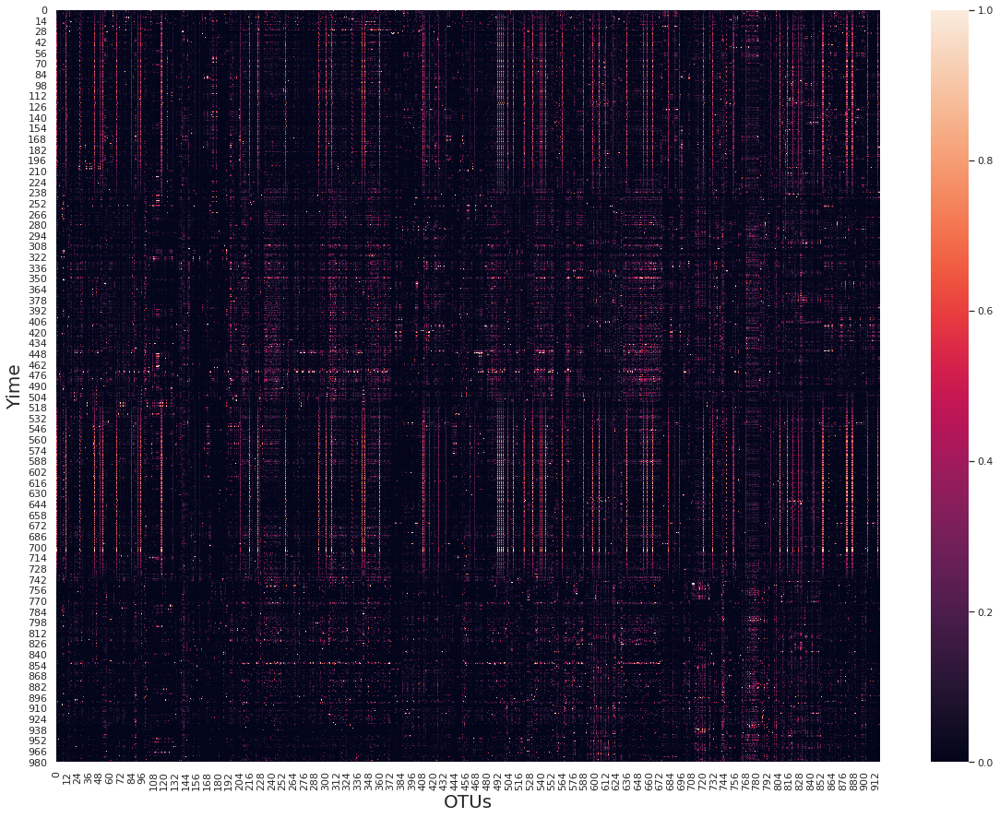

In [8]:
# Relative abundence
sums = np.sum(filtered_otus, axis=1)
X = filtered_otus / sums[:, None]

X = MinMaxScaler().fit_transform(X)
print('Shape of filtered otus: ', filtered_otus.shape)

sns.heatmap(X)
plt.xlabel('OTUs', fontsize=20)
plt.ylabel('Yime', fontsize=20)

Corr table shape:  (917, 917)


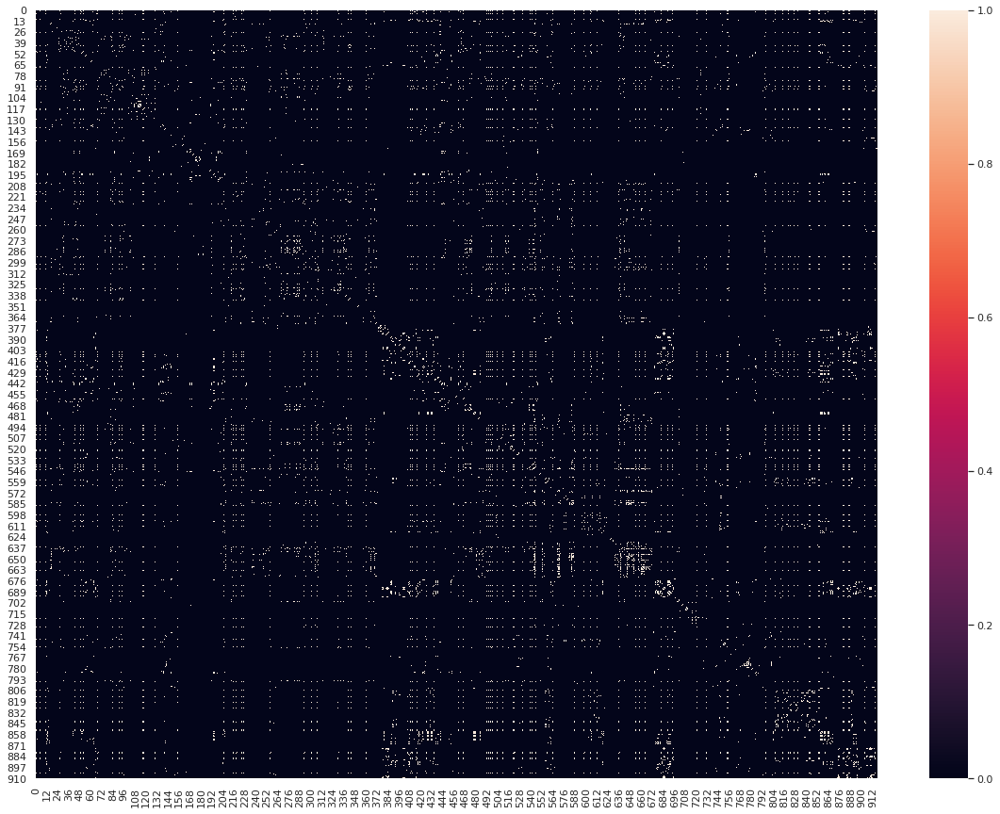

In [9]:
# Construction of the initial co-occurence matrix
import copy
from scipy.stats import spearmanr

threshold = 0.5
corr_table = np.corrcoef(X.T)

print('Corr table shape: ', corr_table.shape)

if threshold == 0:
    initial_matrix = copy.copy(corr_table)
    initial_matrix = initial_matrix.astype(np.int)
    initial_matrix[initial_matrix != threshold] = 1
else:
    initial_matrix = copy.copy(corr_table)
    initial_matrix[np.where((initial_matrix > -threshold) & (initial_matrix < threshold))] = 0
    initial_matrix[initial_matrix >= threshold] = 1
    initial_matrix[initial_matrix <= -threshold] = 1

np.fill_diagonal(initial_matrix, 0)

init_adj_list = list(zip(np.nonzero(initial_matrix)[0], np.nonzero(initial_matrix)[1]))

sns.heatmap(initial_matrix)

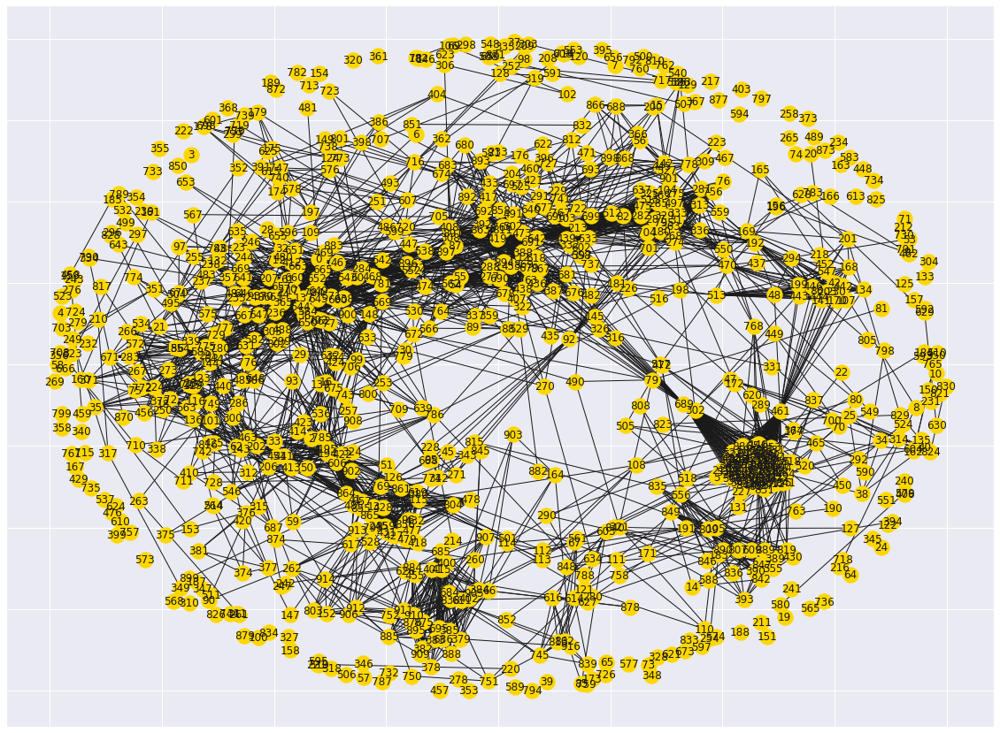

In [10]:
# Plot the initial graph using networkx
g = nx.Graph(initial_matrix)
pos = nx.spring_layout(g, k=0.5, iterations=120)
nx.draw_networkx(g, pos, node_color='gold')
plt.show()

In [11]:
#Adj list
all_adj_lists = []
# filtered_otus = filtered_otus.to_numpy()

for i in tqdm.tqdm(range(X.shape[0])):
    current_adj_matrix = copy.copy(initial_matrix)

    for j in range(X.shape[1]):
        if X[i, j] == 0:
            current_adj_matrix[:, j] = 0
            current_adj_matrix[j, :] = 0
    curr_adj_list = list(zip(np.nonzero(current_adj_matrix)[0], np.nonzero(current_adj_matrix)[1]))
    all_adj_lists.append(curr_adj_list)

num_nodes = initial_matrix.shape[0]

graphs = []
node_labels = list(range(num_nodes))
for graph in tqdm.tqdm(all_adj_lists):
    graph = gl.Graph(graph, num_nodes)
    graph.add_node_labels(node_labels)

    graphs.append(graph)

100%|██████████| 992/992 [00:03<00:00, 266.58it/s]


In [ ]:
num_nodes = adj_matrix.shape[-1]
node_labels = list(range(num_nodes))

graphs = []
adj_matrix[np.where(adj_matrix != 0)] = 1
for graph in tqdm.tqdm(adj_matrix):
    graph = gl.Graph(graph)
    graph.add_node_labels(node_labels)

    graphs.append(graph)

Transforming graphs...


/home/katerynam/anaconda3/lib/python3.7/site-packages/numpy/core/_asarray.py:85: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/home/katerynam/anaconda3/lib/python3.7/site-packages/numpy/core/_asarray.py:85: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


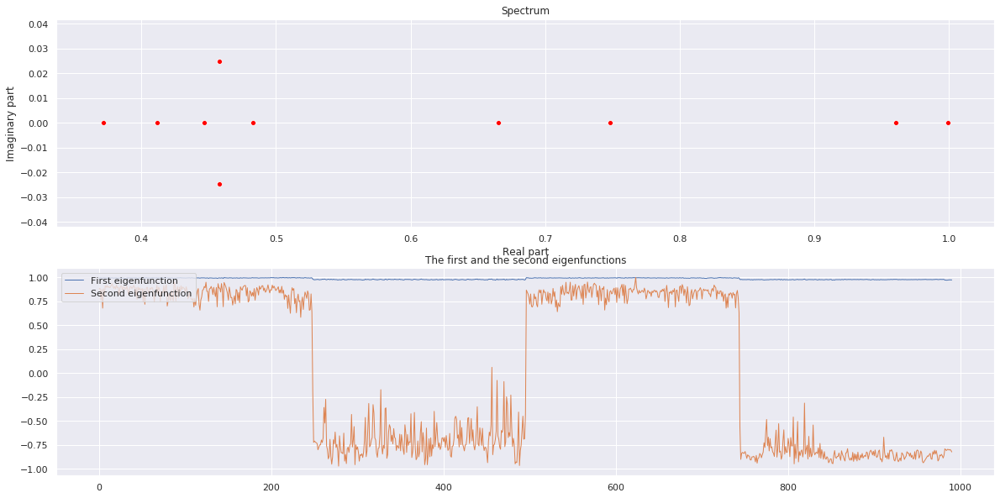

In [13]:
# Hyperparameters of graphKKE
epsilon = 0.5
operator = 'K'
sigma = 100
k = kernels.GaussianKernel(sigma)

# Run graphKKE method
m_graphkke.graphkke(graphs, k, epsilon=epsilon, outdir=path + 'result/')

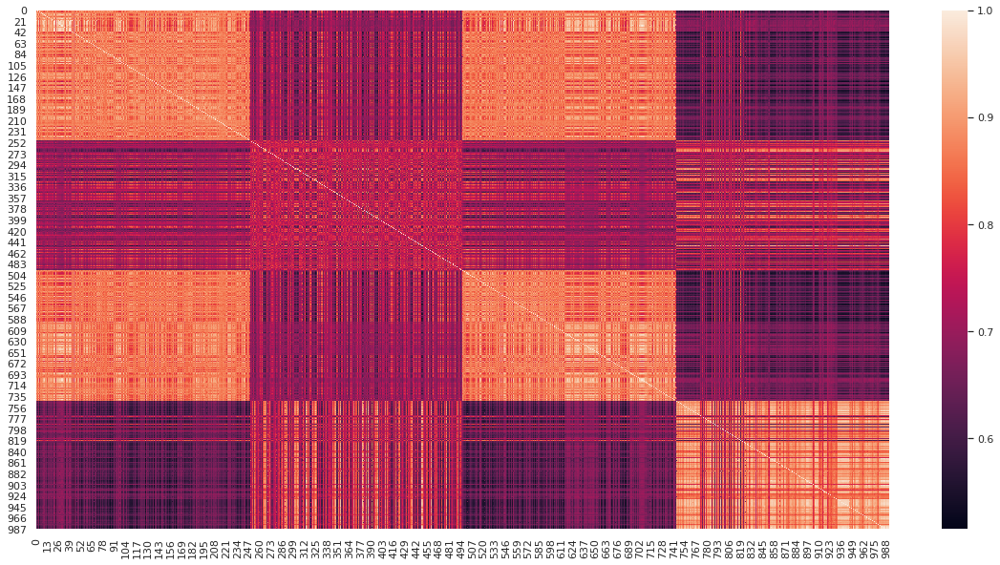

In [14]:
# Load saving metrics
d = np.load(path
            + 'result/eigenvalues.npy')
V = np.load(path
            + 'result/eigenvectors.npy')
G_xx = np.load(path
               + 'result/gramm.npy')

sns.heatmap(G_xx)

In [20]:
# Compute ARI 
epochs = 30
aris = []
for i in range(epochs):
    kmeans = KMeans(n_clusters=2).fit(np.real(V[:, :2]))
    aris.append(adjusted_rand_score(labels[:-1], kmeans.labels_) * 100)
    
print("Mean: ", np.mean(aris))
print("STD: ", np.std(aris))

Mean:  100.0
STD:  0.0


In [ ]:
metadata_dict = {'UBERON:feces': 0, 'UBERON:sebum': 1, 'UBERON:tongue': 2}

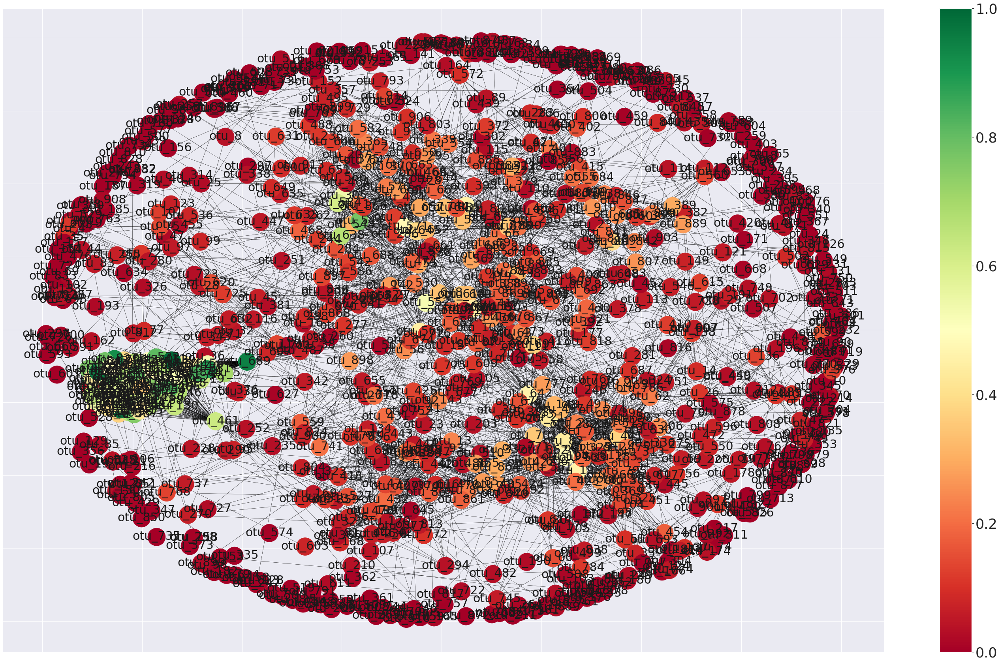

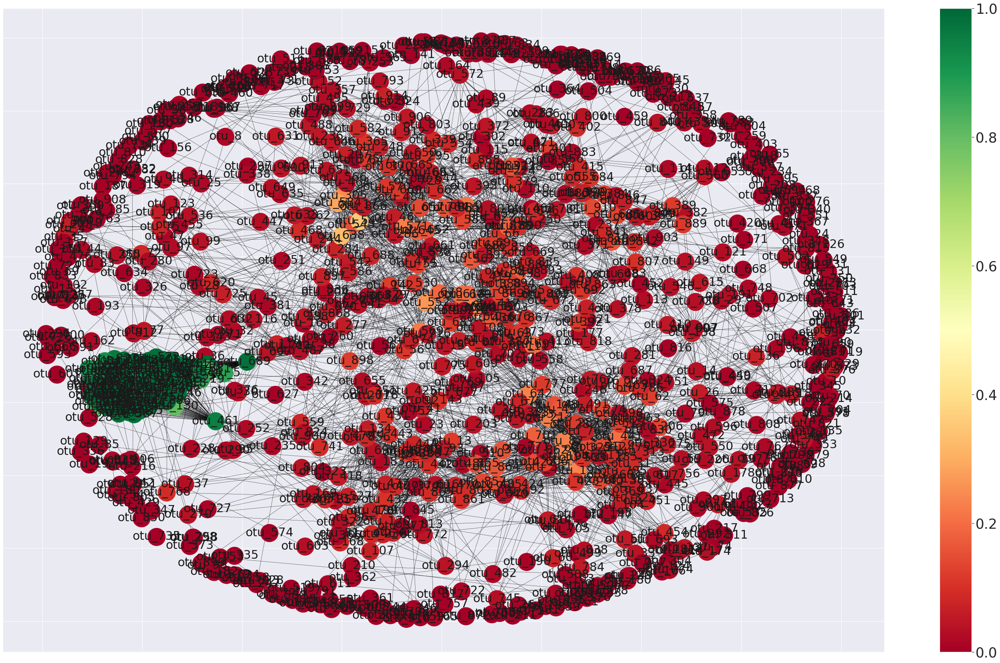

In [18]:
# Plot the average graph for each of the states
adj_matrix = np.array([graph.get_adj_matrix() for graph in graphs])
kmeans = KMeans(n_clusters=2).fit(np.real(V[:, :2]))
y_pred = kmeans.labels_

g = nx.Graph(initial_matrix)
pos  = nx.spring_layout(g, k=1, iterations=150)

avg_graphs_pred = []
unique_labels = np.unique(y_pred)

for label in unique_labels:
    ind = np.argwhere(y_pred == label).flatten()
    one_avg_graph = np.mean(adj_matrix[ind, :], axis = 0)
    avg_graphs_pred.append(one_avg_graph)
avg_graphs__pred = np.array(avg_graphs_pred)

unique_labels = np.unique(y_pred)
dict_nodes = dict(zip(g.nodes(), [f'otu_{i}' for i in g.nodes()]))

graphs_pred = copy.copy(avg_graphs_pred)
sns.set(rc={'figure.figsize': (50, 30)})

for i in range(len(graphs_pred)):
    fig, ax = plt.subplots()
    count_nodes = np.count_nonzero(graphs_pred[i], axis=1)
    sum_nodes = np.sum(graphs_pred[i], axis=0)

    cmap = plt.cm.RdYlGn
    nx.draw_networkx_labels(g, pos, dict_nodes, font_size=30)
    
    nx.draw_networkx(g, pos=pos, edge_color='black',
                     node_color=sum_nodes, with_labels=False, node_size=2000, width=0.5, cmap=cmap)
    
    sm = plt.cm.ScalarMappable(cmap=cmap)
    sm.set_array([])
    cbar = fig.colorbar(sm, ax=ax)
    
    font_size = 35
    cbar.ax.tick_params(labelsize=font_size)
    plt.savefig(os.path.join(path, f'result/clusters_{i}.png'), bbox_inches='tight')